# Sentinel 2 CH4 Multi Band Multi Pass Mapper

This tool provides some measurement capabilities for methane plumes.

In [40]:
import os
import folium
from folium.raster_layers import ImageOverlay
from folium import LayerControl, LatLngPopup
from PIL import Image
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from scipy.ndimage import label
import pandas as pd 
from scipy.spatial import ConvexHull


## Plume tagging

Maually input plume source coordinates here in the format (latitude, longitude), for example:  
    (31.6887, 5.8102),  # Plume 1 (latitude, longitude)  
    (31.7910, 5.8263),  # Plume 2 (latitude, longitude)  
etc...

Plumes that are segmented will need to have each of their segmets taged to be included in the analysis. Additional lines for more plumes can be added as needed.

In [41]:
plume_coords = [
    (31.6887, 5.8102),  # Plume 1 (latitude, longitude)
    (31.7910, 5.8263),  # Plume 2 (latitude, longitude)
    (31.7978, 5.8341),  # Plume 4 (latitude, longitude)
    (31.9101, 6.0135),  # Plume 3 (latitude, longitude)
    (31.6389, 6.0025),  # Plume 4 (latitude, longitude)
]

## Loading and configuring map.

This section loads the SWIR data and loads the colourmap in preparation for the analysis. It also provides the average/mean value of the dataset, allowing us to see how much a plume rises above background levels. 

In [49]:
# Load TIFF file
tiff_file_path = r"C:\GIS_Course\Methane_Point_Detection\Sentinel-2_Algeria_Methane\SWIR_diff_4326.tiff"
with rasterio.open(tiff_file_path) as tiff_file:
    raster_data = tiff_file.read(1)  # Read the first band
    nodata_value = tiff_file.nodata if tiff_file.nodata is not None else -9999
    bounds = tiff_file.bounds
    transform = tiff_file.transform

# Mask nodata values
masked_data = np.ma.masked_equal(raster_data, nodata_value)
mean, std = np.nanmean(masked_data), np.nanstd(masked_data)
std_factor = 2
lower_bound, upper_bound = mean - std_factor * std, mean + std_factor * std
normalized_data = (masked_data - lower_bound) / (upper_bound - lower_bound)
normalized_data = np.clip(normalized_data, 0, 1)  # Clip to [0, 1]

# Apply colormap
cmap = plt.get_cmap('plasma')
rgb_data = (cmap(normalized_data)[:, :, :3] * 255).astype(np.uint8)

# Initialize the map
center_lat = (bounds.top + bounds.bottom) / 2
center_lon = (bounds.left + bounds.right) / 2
m = folium.Map(location=[center_lat, center_lon], zoom_start=11, control_scale=True)

# Add SWIR_diff overlay
image_bounds = [[bounds.bottom, bounds.left], [bounds.top, bounds.right]]
swir_overlay = ImageOverlay(
    image=rgb_data,
    bounds=image_bounds,
    opacity=0.6,
    interactive=True,
    cross_origin=False,
    zindex=1,
)
swir_overlay.add_to(m)

# Mark plume locations
for i, (lat, lon) in enumerate(plume_coords):
    folium.CircleMarker(
        location=[lat, lon],
        radius=5,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=1,
        popup=f"Plume {i + 1}",
    ).add_to(m)

# Calculate the mean value of the masked data
dataset_mean_value = masked_data.mean()

# Print the mean value
print(f"Mean value of the dataset: {dataset_mean_value}")

Mean value of the dataset: -57.93212366599478


## Viewing the data. 

Now everything is loaded, we can run the analysis. 

   Plume Location (lat, lon)    Max Value  Mean Value  Size (pixels)  \
0      1   (31.6887, 5.8102)  7265.539016   74.027037         320980   
1      2    (31.791, 5.8263)  6979.804904  274.547819           1838   
2      3   (31.7978, 5.8341)   706.431794   95.966375           8735   
3      4   (31.9101, 6.0135)  6647.184152  172.235170           5609   
4      5   (31.6389, 6.0025)  7014.453288  855.918506            280   

           Status  
0  Plume detected  
1  Plume detected  
2  Plume detected  
3  Plume detected  
4  Plume detected  



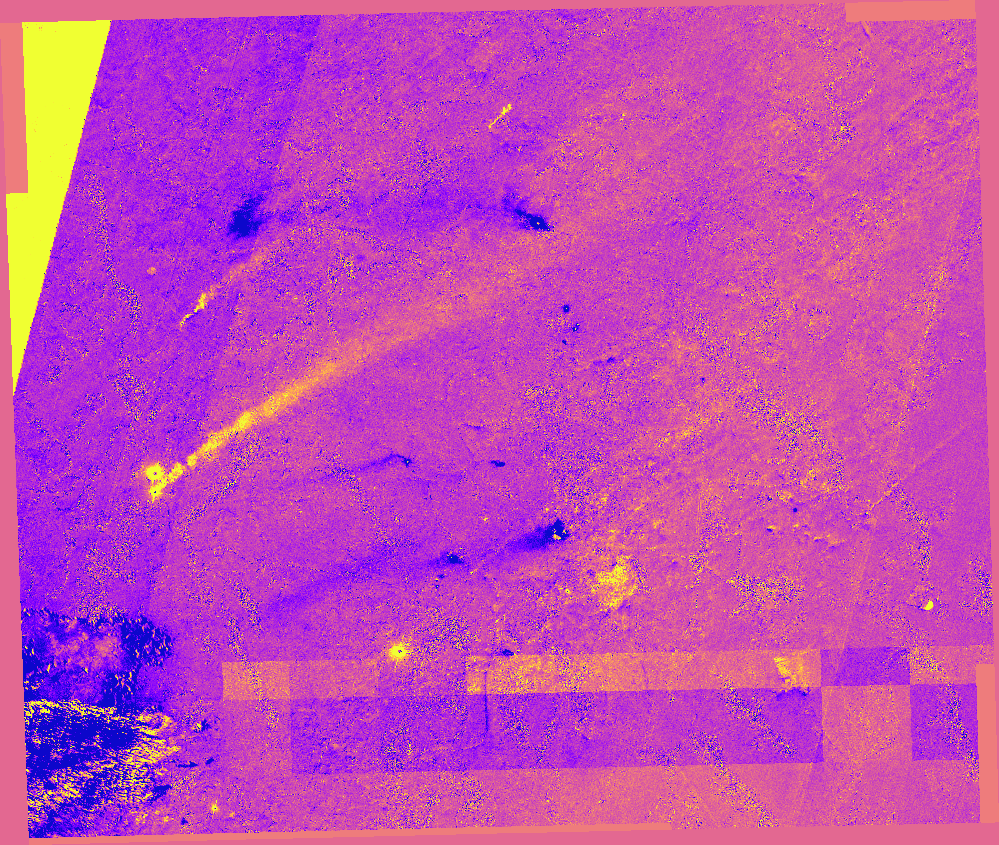

In [50]:
# Analyze plumes
def analyze_plume(masked_data, plume_coords, transform):
    plume_results = []
    labeled_array, _ = label(masked_data > np.percentile(masked_data.compressed(), 65))  # Identify plumes
    for i, (lat, lon) in enumerate(plume_coords):
        try:
            row, col = rasterio.transform.rowcol(transform, lon, lat)
            row, col = int(row), int(col)
            plume_label = labeled_array[row, col]
            if plume_label == 0:
                plume_results.append({
                    "Plume": i + 1,
                    "Location (lat, lon)": (lat, lon),
                    "Status": "No plume detected",
                })
            else:
                plume_region = labeled_array == plume_label
                plume_values = masked_data[plume_region]
                plume_pixels = np.column_stack(np.where(plume_region))

                # Convert pixel coordinates to lat/lon
                plume_longitudes, plume_latitudes = rasterio.transform.xy(
                    transform, plume_pixels[:, 0], plume_pixels[:, 1]
                )
                points = np.array(list(zip(plume_latitudes, plume_longitudes)))
                hull = ConvexHull(points)
                polygon_coordinates = [(points[vertex, 0], points[vertex, 1]) for vertex in hull.vertices]

                # Add polygon to the map
                folium.Polygon(
                    locations=polygon_coordinates,
                    color="blue",
                    weight=1,
                    fill=True,
                    fill_color="blue",
                    fill_opacity=0.4,
                    popup=f"Plume {i + 1} region",
                ).add_to(m)

                plume_results.append({
                    "Plume": i + 1,
                    "Location (lat, lon)": (lat, lon),
                    "Max Value": plume_values.max(),
                    "Mean Value": plume_values.mean(),
                    "Size (pixels)": plume_region.sum(),
                })
        except Exception as e:
            plume_results.append({
                "Plume": i + 1,
                "Location (lat, lon)": (lat, lon),
                "Status": f"Error: {e}",
            })
    return plume_results

# Perform analysis
plume_results = analyze_plume(masked_data, plume_coords, transform)

# Convert results to DataFrame
plume_df = pd.DataFrame([{
    "Plume": result["Plume"],
    "Location (lat, lon)": result["Location (lat, lon)"],
    "Max Value": result.get("Max Value", None),
    "Mean Value": result.get("Mean Value", None),
    "Size (pixels)": result.get("Size (pixels)", None),
    "Status": result.get("Status", "Plume detected"),
} for result in plume_results])

# Display DataFrame
print(plume_df)

# Add a layer control and click event
LayerControl().add_to(m)
m.add_child(LatLngPopup())

# Display the map
m